# Ace of Face: Facial Keypoint Detection Challenge

Group members: Jorge, Graham, Justin, Preethi
Class: W207 Monday 6:30p

Our group undertook the Kaggle challenge to identify facial keypoints (i.e. left eye center) on images of faces.



In [1]:
# Download Packages
import numpy as np
from numpy import expand_dims
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import clear_output
from time import sleep
import os
import cv2
from math import sin, cos, pi

from keras.layers import Conv2D, Dropout, Dense, Flatten
from keras.models import Sequential
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential, Model
from keras.layers import Activation, Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Conv2D, MaxPool2D, ZeroPadding2D
from keras.models import model_from_json
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping
import keras.callbacks

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import tensorflow
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Helper Functions

def show_keypoints(image, keypoints):
    '''
    Show image with keypoints
    Args:
        image (array-like or PIL image): The image data. (M, N)
        keypoints (array-like): The keypoits data. (N, 2)
    '''

    plt.imshow(image, cmap='gray')
    if len(keypoints):
        plt.scatter(keypoints[:, 0], keypoints[:, 1], s=24, marker='.', c='r')


def show_images(df, indxs, ncols=5, figsize=(15, 10), with_keypoints=True):
    '''
    Show images with keypoints in grids
    Args:
        df (DataFrame): data (M x N)
        idxs (iterators): list, Range, Indexes
        ncols (integer): number of columns (images by rows)
        figsize (float, float): width, height in inches
        with_keypoints (boolean): True if show image with keypoints
    '''
    plt.figure(figsize=figsize)
    nrows = len(indxs) // ncols + 1
    for i, idx in enumerate(indxs):
        image = np.fromstring(df.loc[idx, 'Image'], sep=' ').astype(np.float32)\
            .reshape(-1, IMG_SIZE)
        if with_keypoints:
            keypoints = df.loc[idx].drop('Image').values.astype(np.float32)\
                .reshape(-1, 2)
        else:
            keypoints = []
        plt.subplot(nrows, ncols, i + 1)
        plt.title(f'Sample #{idx}')
        plt.axis('off')
        plt.tight_layout()
        show_keypoints(image, keypoints)
    plt.show()


def get_features(df, dim=2):
    """
    Input train or test dataframe and number of dimensions you want features in.
    Returns vector of features (pixel intensities for all examples)
    TODO: divided by 255 for scaling?
    """
    images_list = []
    df1 = df.copy()
    df1.reset_index(inplace=True)
    for i in range(0, df1.shape[0]):
        image = df1["Image"][i].split(' ')
        image = ["0" if x == '' else x for x in image]
        images_list.append(image)
    images_array = np.array(images_list, dtype="float")
    if dim == 2:
        images_features = images_array.reshape(-1, 96, 96, 1)
    else:
        images_features = images_array
    return images_features


def get_labels(df):
    '''
    Input only test dataframe
    Returns vector of labels (num_examples by 30 column vector of X,Y coords for face keypoints)
    Grabbing the corresponding training labels
    '''
    labels_df = df.copy()
    labels_df = labels_df.drop('Image', axis=1)
    y_train = []
    for i in range(0, len(labels_df)):
        y = labels_df.iloc[i, :]
        y_train.append(y)
    return np.array(y_train, dtype='float')


def plot_img(image, label, axis):
    '''
    Simplfied version of show_images
    Shows one image
    '''
    image = image.reshape(96, 96)
    axis.imshow(image, cmap='gray')
    axis.scatter(label[0::2], label[1::2], s=24, marker='.', c='r')


def load_images(image_data):
    images = []
    for idx, df in image_data.iterrows():
        image = np.array(df['Image'].split(' '), dtype=int)
        image = np.reshape(image, (96, 96, 1))
        images.append(image)
    images = np.array(images)
    return images


def convert_images(image_data):
    temp = np.array(image_data)/255
    return temp


class Normalize(object):
    '''Normalize input images'''

    def __call__(self, sample):
        image, keypoints = sample['image'], sample['keypoints']
        return {'image': image / 255.,  # scale to [0, 1]
                'keypoints': keypoints}


# Data Augmentation
# Create function to flip images horizontally

def flip_horizontal(features, labels):
    flipped_labels = []
    flipped_features = np.flip(features, axis=2)
    for index, value in enumerate(labels):
        flipped_labels.append(
            [96.-coor if index % 2 == 0 else coor for index, coor in enumerate(value)])
    return flipped_features, np.asarray(flipped_labels)

# Create function to rotate images
# https://in.mathworks.com/matlabcentral/answers/93554-how-can-i-rotate-a-set-of-points-in-a-plane-by-a-certain-angle-about-an-arbitrary-point


# arbitary list of angles to use to rotate the images
angle_list = [5, 7.5, 10, 12.5, 15]


def perform_rotation(features, labels):
    rotated_labels = []
    rotated_features = []
    for item in angle_list:
        for angle in [item, -item]:
            M = cv2.getRotationMatrix2D((48, 48), angle, 1.0)
            angle_radians = -angle*pi/180.

            # features
            for feat in features:
                rotated_feat = cv2.warpAffine(
                    feat, M, (96, 96), flags=cv2.INTER_CUBIC)
                rotated_features.append(rotated_feat)

            # labels
            for lab in labels:
                rotated_lab = lab - 48.
                for idx in range(0, len(rotated_lab), 2):
                    rotated_lab[idx] = rotated_lab[idx] * \
                        cos(angle_radians) - \
                        rotated_lab[idx+1]*sin(angle_radians)
                    rotated_lab[idx+1] = rotated_lab[idx] * \
                        sin(angle_radians) + \
                        rotated_lab[idx+1]*cos(angle_radians)
                rotated_lab += 48.   # Add the earlier subtracted value
                rotated_labels.append(rotated_lab)

    return np.reshape(rotated_features, (-1, 96, 96, 1)), np.asarray(rotated_labels)


# Create function to update image lighting

# arbitrary list of lighting factors to use to brighten/dim the images
lighting_factor_list = [0.5, 0.75, 1.25, 1.5]


def update_lighting(features, labels):
    updated_features = []
    updated_labels = []
    for item in lighting_factor_list:
        new_features = np.clip(features*item, 0.0, 1.0)
        updated_features.extend(new_features)
        updated_labels.extend(labels)
    return np.asarray(updated_features), np.asarray(updated_labels)


# Create function to move the center of the image up, down, left and right

# arbitrary list of pixel values to use to move center of image
pixel_moves = [4, 8, 16, 32]


def move_center(features, labels):
    shifted_features = []
    shifted_labels = []
    for item in pixel_moves:
        for (xval, yval) in [(item, item), (-item, item), (item, -item), (-item, -item)]:
            M = np.float32([[1, 0, xval], [0, 1, yval]])
            for feat, lab in zip(features, labels):
                shifted_feature = cv2.warpAffine(
                    feat, M, (96, 96), flags=cv2.INTER_CUBIC)
                shifted_label = np.array(
                    [(point+xval) if idx % 2 == 0 else (point+yval) for idx, point in enumerate(lab)])
                if np.all(0.0 < shifted_label) and np.all(shifted_label < 96.0):
                    shifted_features.append(shifted_feature.reshape(96, 96, 1))
                    shifted_labels.append(shifted_label)
    shifted_labels = np.clip(shifted_labels, 0.0, 96.0)
    return np.asarray(shifted_features), shifted_labels

# Create function to add noise to images


# arbitrary noise factor
noise_factor = 0.02


def add_noise(features, labels):
    noise_features = []
    for feat in features:
        noise_feat = cv2.add(feat, noise_factor*np.random.randn(96, 96, 1))
        noise_features.append(noise_feat.reshape(96, 96, 1))
    return np.asarray(noise_features), labels


# Add Blur
def add_blur(features, labels):
    blur_features = []
    for feat in features:
        blur_feat = cv2.blur(feat, (4, 4))
        blur_features.append(blur_feat.reshape(96, 96, 1))
    return np.asarray(blur_features), labels

In [8]:
# Download Data from Kaggle

# Import data
os.environ['KAGGLE_USERNAME'] = "prkrlkp1"
os.environ['KAGGLE_KEY'] = "8638f8db0c2cdf1d00e1f117b8439a71"

# Download data from Kaggle
!kaggle competitions download -c facial-keypoints-detection -p data_files --force

# Unzip data
!unzip -o data_files/facial-keypoints-detection.zip -d data_files
!unzip -o data_files/test.zip -d data_files
!unzip -o data_files/training.zip -d data_files

 96%|████████████████████████████████████▎ | 73.0M/76.3M [00:02<00:00, 35.0MB/s]
100%|██████████████████████████████████████| 76.3M/76.3M [00:02<00:00, 33.0MB/s]
Archive:  data_files/facial-keypoints-detection.zip
  inflating: data_files/IdLookupTable.csv  
  inflating: data_files/SampleSubmission.csv  
  inflating: data_files/test.zip     
  inflating: data_files/training.zip  
Archive:  data_files/test.zip
  inflating: data_files/test.csv     
Archive:  data_files/training.zip
  inflating: data_files/training.csv  


In [9]:
# Create data dfs
data_dir = 'data_files/'
lookid_data = pd.read_csv(data_dir + 'IdLookupTable.csv')
sample_sub = pd.read_csv(data_dir + 'SampleSubmission.csv')
train_data = pd.read_csv(data_dir + 'training.csv')
test_data = pd.read_csv(data_dir + 'test.csv')

# No missing features
clean_data = train_data.copy().dropna()

IMG_SIZE = 96  # image size 96 x 96 pixels

## Exploratory Data Analysis

We explore the training data set in order to see what images might give us the most trouble in predicting the facial keypoints, and how we can solve for it. 

In [10]:
train_data.head()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,...,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,...,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,...,54.166539,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383,193 192 193 194 194 194 193 192 168 111 50 12 ...
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,...,64.889521,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166,147 148 160 196 215 214 216 217 219 220 206 18...


In [11]:
# Checking the size of the data set and the columns it contains
print("Shape of train_data:", train_data.shape)
print()
print("Column names:")
print(train_data.columns)
print()
print("Contains missing data points:", train_data.isnull().values.any())
print()
print("Missing data points number by feature:")
print(train_data.isnull().sum())

Shape of train_data: (7049, 31)

Column names:
Index(['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
       'right_eye_center_y', 'left_eye_inner_corner_x',
       'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
       'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
       'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
       'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
       'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
       'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
       'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
       'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
       'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
       'mouth_right_corner_y', 'mouth_center_top_lip_x',
       'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
       'mouth_center_bottom_lip_y', 'Image'],
      dtype='object')

Contains missing data points: True

Missing data points 

The only features that don't have many missing features are the nose tips, left & right eye centers, and bottom lip. Other than thes four, roughly 5k images have the other features missing.

In [12]:
# Checking the type of a random point on the table outside of `Image`
rand_point = train_data.iloc[52, 4]
print(type(rand_point))

<class 'numpy.float64'>


In [13]:
# Exploring the contents of the `Image` column
img_test = train_data.iloc[0, 30]
print(type(img_test))
print()
# Splitting the string into a list for each number
img_test = img_test.split(" ")
# Data is in string format so changed to int
img_test = list(map(int, img_test))
# Data is a 1-D array of 9216 pixels
img_np = np.array(img_test).reshape(96, 96)
print(img_np)

<class 'str'>

[[238 236 237 ... 250 250 250]
 [235 238 236 ... 249 250 251]
 [237 236 237 ... 251 251 250]
 ...
 [186 183 181 ...  52  57  60]
 [189 188 207 ...  61  69  78]
 [191 184 184 ...  70  75  90]]


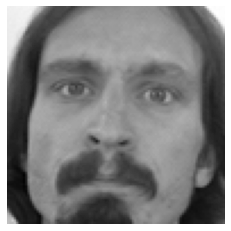

In [14]:
# Checking what selected image displays
plt.imshow(img_np, cmap="gray", aspect='equal')
plt.xticks = []
plt.yticks = []
plt.axis('off')
plt.show()

Dataset 'training' conclusion¶
This dataset contains all of the training examples needed to beginning training the machine learning model. It is split by labels of either the x or y coordinate of a specific face part. It also contains a column that has the image that corresponds with the coordinates in the other columns. Each row is a new image with its respective coordinates.

The coordinates values are floats and represent the pixel location on the included image in either the x or y orientation. The image is included in the dataset as a string of all of the pixel values. After converting the string into a list and then array of ints, each image contains an array of 9216 pixels. This comes out to be a image of 96 by 96 pixels.

**Dataset contains 7049 rows and 30 features/labels or 15 pairs of coordinates.**

**Not all of the images have coordinates for all of the possible labels in the dataset.**

In [15]:
#Test set contains 1783 images
print("Shape of test_data:", test_data.shape)

Shape of test_data: (1783, 2)


To deal the missing data, we are first going to seperate the data into different groups. One containing only complete data points, one containing 5 or less points missing, one containing 15 or less points, and other greater than 15 points missing.

Using code provided by the Medium article: https://medium.com/diving-in-deep/facial-keypoints-detection-with-pytorch-86bac79141e4
Using functions show_keypoints and show_images from article

We will begin to the seperate the groups, by counting the amount of NaN each row contains

In [16]:
# Counting the amount of NA in each row and add results as a new column
train_data['Num_NaN'] = train_data.isnull().sum(axis=1)
train_data.tail()

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image,Num_NaN
7044,67.402546,31.842551,29.746749,38.632942,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.426637,79.683921,71 74 85 105 116 128 139 150 170 187 201 209 2...,22
7045,66.134400,38.365501,30.478626,39.950198,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.287397,77.983023,60 60 62 57 55 51 49 48 50 53 56 56 106 89 77 ...,22
7046,66.690732,36.845221,31.666420,39.685042,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,49.462572,78.117120,74 74 74 78 79 79 79 81 77 78 80 73 72 81 77 1...,22
7047,70.965082,39.853666,30.543285,40.772339,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.065186,79.586447,254 254 254 254 254 238 193 145 121 118 119 10...,22
7048,66.938311,43.424510,31.096059,39.528604,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,45.900480,82.773096,53 62 67 76 86 91 97 105 105 106 107 108 112 1...,22


In [17]:
# Checking the unique values of NaN counts
train_data["Num_NaN"].value_counts()

22    4755
0     2140
2       87
4       28
24      10
6        9
8        8
12       5
10       3
14       2
20       2
Name: Num_NaN, dtype: int64

**We examine the complete set of data.**

> Indented block





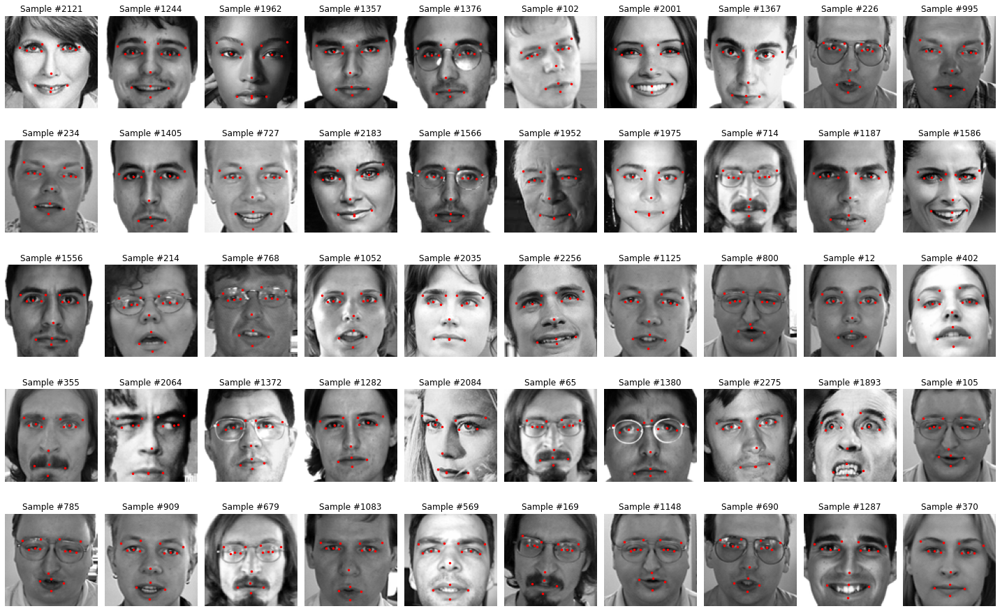

In [18]:
# Dataframe of only completed values, no NaN
training_complete = train_data[train_data["Num_NaN"] == 0]
training_complete.isnull().values.any()
training_complete = training_complete.drop("Num_NaN", axis=1)

# Displaying images with no NaN, complete labels
# Pictures are randomized
rand_img = np.random.choice(training_complete.index, 50, replace=False)
show_images(training_complete, rand_img, ncols=10, figsize=(20, 15))

**5 or less missing features are shown below.**

*   Images similar to complete label set
*   Sample #1907 label points seems to complete miss the image
*   Some tracking points are not clearly visible
*   Some image faces are rotated to the side
*   Contains 115 images

2    87
4    28
Name: Num_NaN, dtype: int64

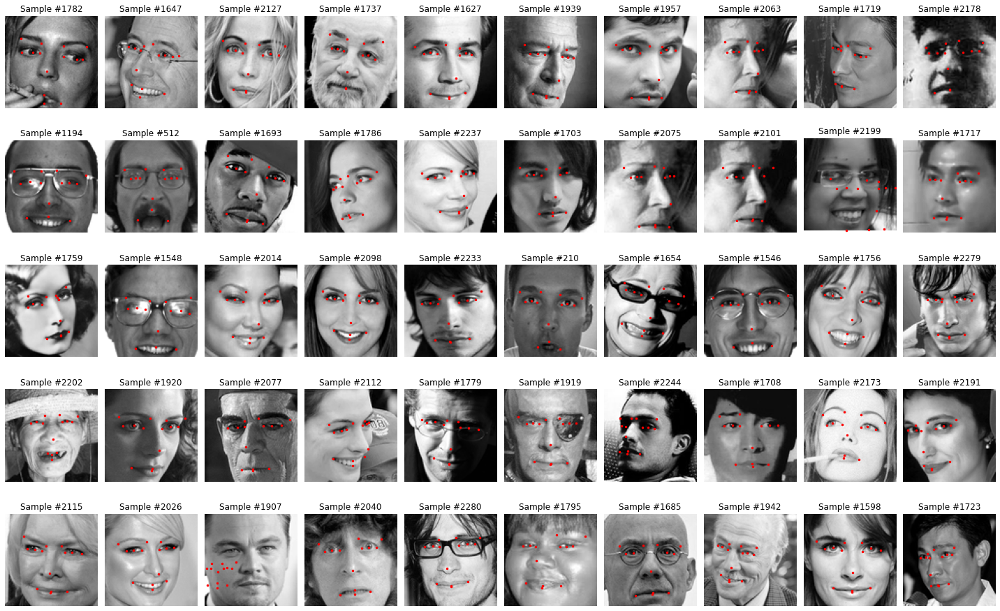

In [19]:
# Selecting data with 5 or less NaN values, except 0
training_5 = train_data[(train_data["Num_NaN"] >= 1) &
                        (train_data["Num_NaN"] < 6)]
display(training_5["Num_NaN"].value_counts())
training_5 = training_5.drop("Num_NaN", axis=1)
rand_img = np.random.choice(training_5.index, 50, replace=False)
show_images(training_5, rand_img, ncols=10, figsize=(20, 15))

**Images with greater than 5 less than 10 missing features are shown**

*   Some images are cut so the complete face is not shown
*   Images are faces rotated so they are not completely facing the camera
*   Some tracking points are covered and can not be seen

*   Contains 20 images


6     9
8     8
10    3
Name: Num_NaN, dtype: int64

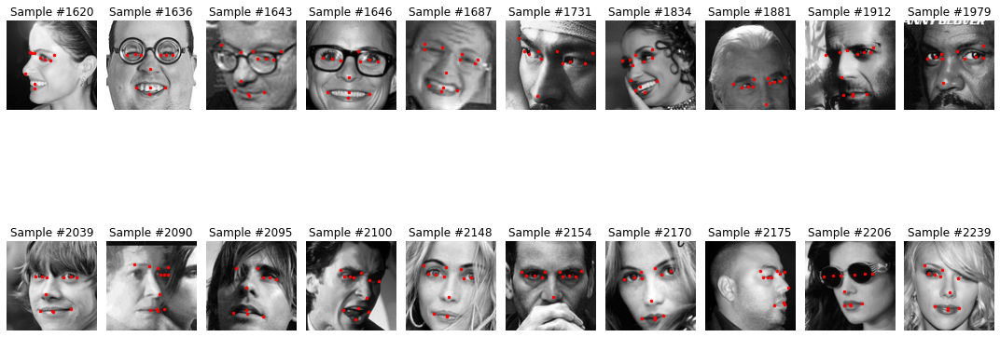

In [20]:
# Data with more than 5 and less than 10 NaN
training_10 = train_data[(train_data["Num_NaN"] > 5)
                         & (train_data["Num_NaN"] < 11)]
display(training_10["Num_NaN"].value_counts())
training_10 = training_10.drop("Num_NaN", axis=1)
show_images(training_10, training_10.index, ncols=10)

**Images with 10-15 missing features are shown**

* Subjects are wearing sunglasses. 

Only 7 images are shown.

12    5
14    2
Name: Num_NaN, dtype: int64

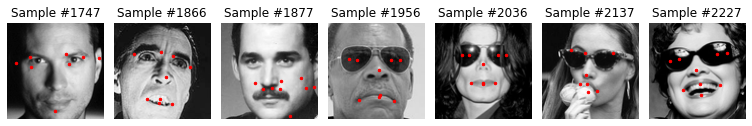

In [21]:
# Data with more than 10 and less than 15 NaN
training_15 = train_data[(train_data["Num_NaN"] > 10)
                         & (train_data["Num_NaN"] < 16)]
display(training_15["Num_NaN"].value_counts())
training_15 = training_15.drop("Num_NaN", axis=1)
show_images(training_15, training_15.index, ncols=10)

**Images with 15-20 missing features are shown**

* Images are cropped so the complete faces are not shown
* Some images are of low quality so it is hard to distinguish features

Contains 12 images

24    10
20     2
Name: Num_NaN, dtype: int64

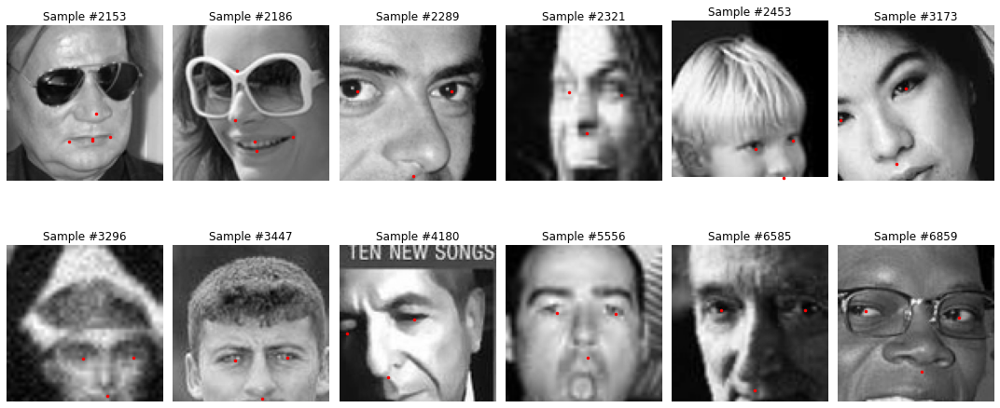

In [22]:
# Data with more than 15 NaN excluding 22 NaN value due to that one having the most examples
training_most_nan = train_data[(train_data["Num_NaN"] > 15) & (
    train_data["Num_NaN"] != 22)]
display(training_most_nan["Num_NaN"].value_counts())
training_most_nan = training_most_nan.drop("Num_NaN", axis=1)
show_images(training_most_nan, training_most_nan.index, ncols=6)

**Images with 22 missing features are shown**

* A number of the same problems above are seen, in addition to blurriness and graininess
* Some of the images are of low quality, can not see features clearly
* Some of the images look of decent quality but are missing points

Contains the most - 4755 images. 


22    4755
Name: Num_NaN, dtype: int64

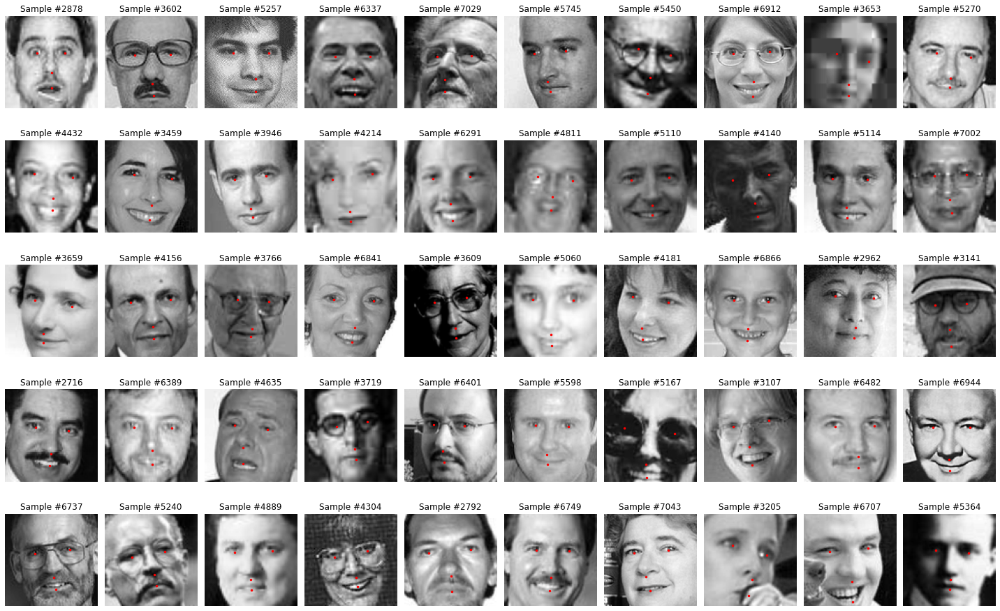

In [23]:
# Data with 22 NaN, contains the most examples
training_22 = train_data[train_data["Num_NaN"] == 22]
display(training_22['Num_NaN'].value_counts())
training_22 = training_22.drop("Num_NaN", axis=1)
rand_img = np.random.choice(training_22.index, 50, replace=False)
show_images(training_22, rand_img, ncols=10, figsize=(20, 15))

Next we will explore the images by the type of feature missing to see if any trends can be seen

Will begin with checking if any of the features are missing only one of their coordinates

In [24]:
# Gathering positions of images with missing features

train_data = train_data.drop("Num_NaN", axis=1)    # Removing 'Num_NaN' column

missing_data_indices = []

for column in train_data[['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x',
                          'right_eye_center_y', 'left_eye_inner_corner_x',
                          'left_eye_inner_corner_y', 'left_eye_outer_corner_x',
                          'left_eye_outer_corner_y', 'right_eye_inner_corner_x',
                          'right_eye_inner_corner_y', 'right_eye_outer_corner_x',
                          'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
                          'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x',
                          'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x',
                          'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x',
                          'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y',
                          'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x',
                          'mouth_right_corner_y', 'mouth_center_top_lip_x',
                          'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x',
                          'mouth_center_bottom_lip_y']]:

    # Select column contents by column
    # name using [] operator
    missing_data_indices.append(
        train_data[train_data[column].isnull()].index.tolist())
    columnSeriesObj = train_data[column].isnull().sum()
    print('{:<20}     Missing: {:<10,d}     Pct Missing: {:<10.3f}'.format(
        column, columnSeriesObj, columnSeriesObj/train_data.shape[0]))

left_eye_center_x        Missing: 10             Pct Missing: 0.001     
left_eye_center_y        Missing: 10             Pct Missing: 0.001     
right_eye_center_x       Missing: 13             Pct Missing: 0.002     
right_eye_center_y       Missing: 13             Pct Missing: 0.002     
left_eye_inner_corner_x     Missing: 4,778          Pct Missing: 0.678     
left_eye_inner_corner_y     Missing: 4,778          Pct Missing: 0.678     
left_eye_outer_corner_x     Missing: 4,782          Pct Missing: 0.678     
left_eye_outer_corner_y     Missing: 4,782          Pct Missing: 0.678     
right_eye_inner_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_inner_corner_y     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_x     Missing: 4,781          Pct Missing: 0.678     
right_eye_outer_corner_y     Missing: 4,781          Pct Missing: 0.678     
left_eyebrow_inner_end_x     Missing: 4,779          Pct Missing: 0.678     
left_eyebrow_inner_

In [25]:
# Confirming whether there is any missing data for only one of the x,y coordinates
# associated with a facial keypoint;
# True means both coordinates have the same number of missing

print("Number of feature columns:", len(missing_data_indices))
print()
for i in range(0, 30, 2):
    a = missing_data_indices[i] == missing_data_indices[i+1]
    print("i = {}; {}".format(i, a))

Number of feature columns: 30

i = 0; True
i = 2; True
i = 4; True
i = 6; True
i = 8; True
i = 10; True
i = 12; True
i = 14; True
i = 16; True
i = 18; True
i = 20; True
i = 22; True
i = 24; True
i = 26; True
i = 28; True



Examples of images missing left_eye_center_x


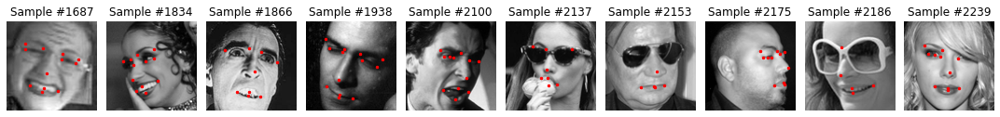


Examples of images missing left_eye_center_y


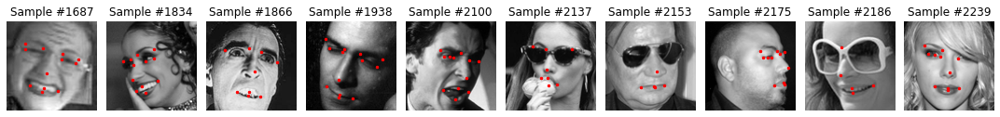


Examples of images missing right_eye_center_x


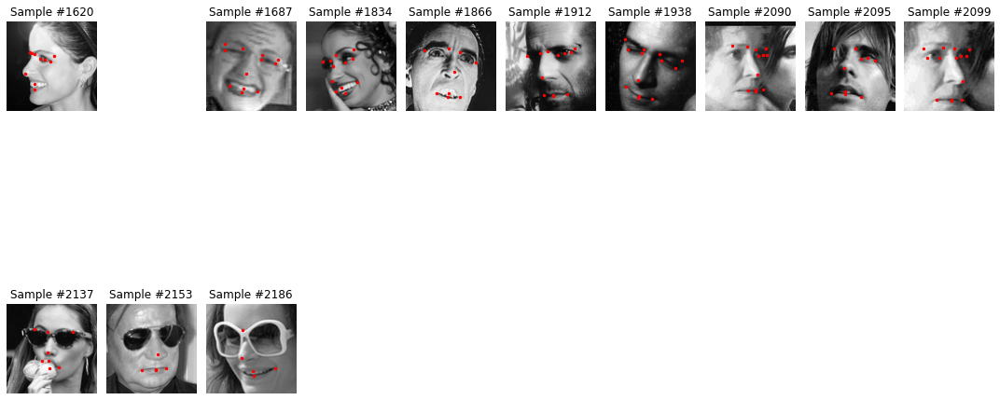


Examples of images missing right_eye_center_y


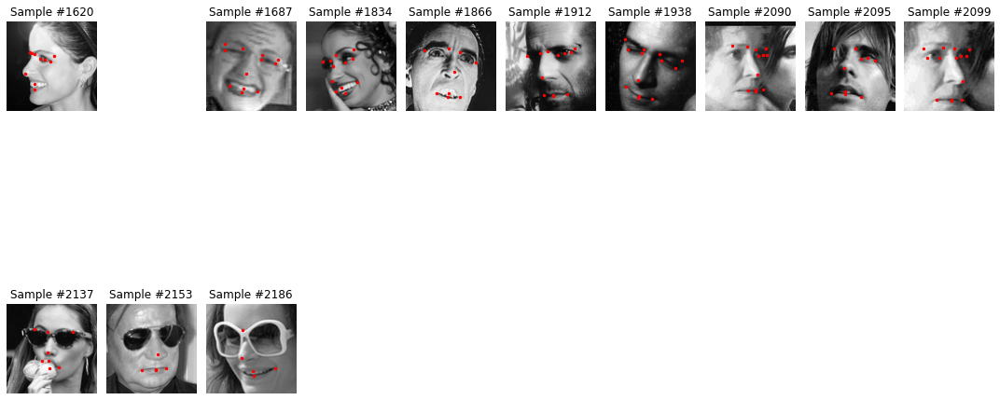


Examples of images missing left_eye_inner_corner_x


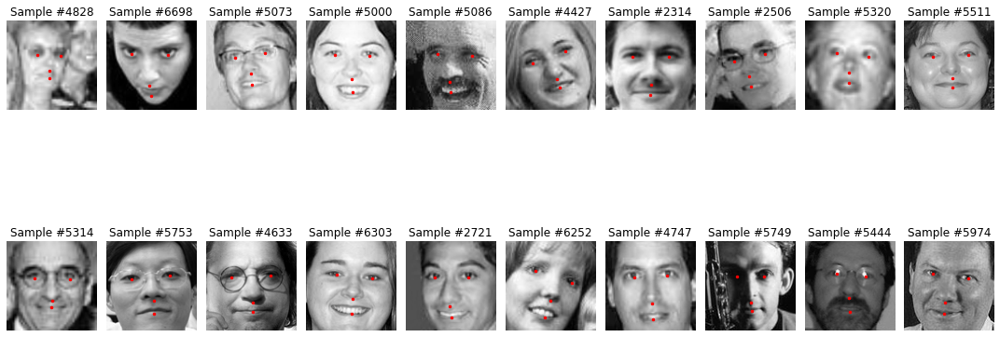


Examples of images missing left_eye_inner_corner_y


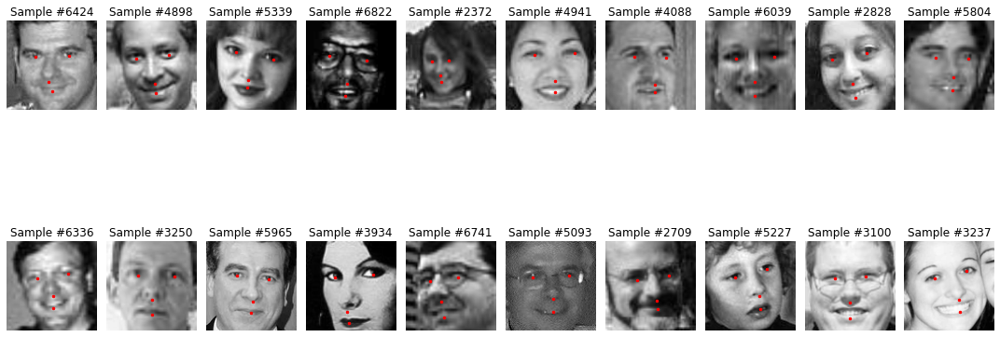


Examples of images missing left_eye_outer_corner_x


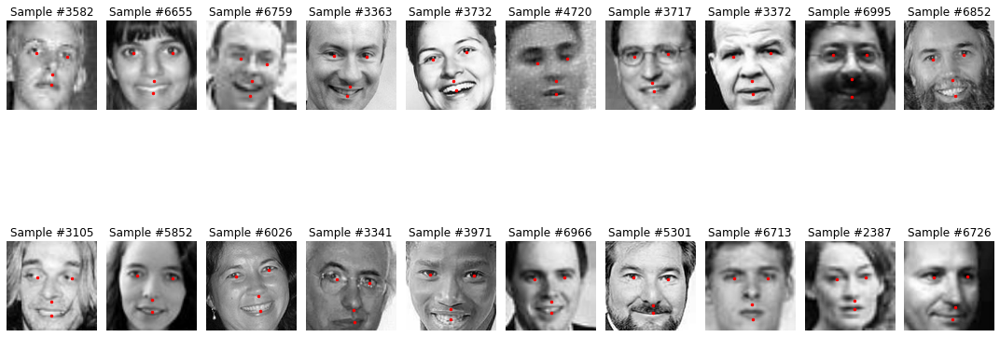


Examples of images missing left_eye_outer_corner_y


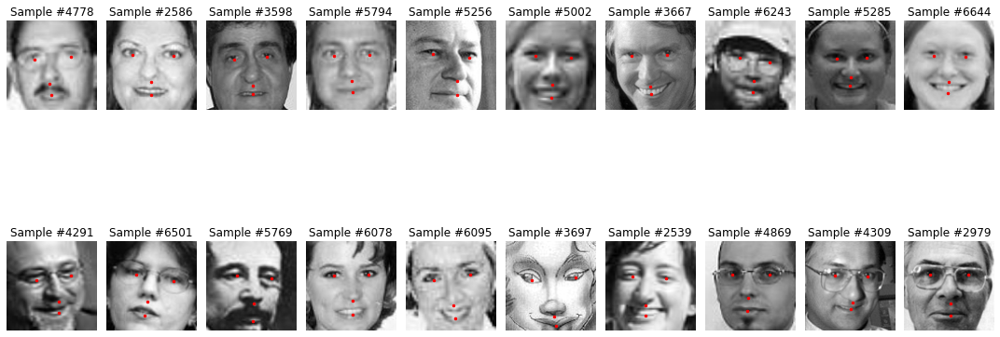


Examples of images missing right_eye_inner_corner_x


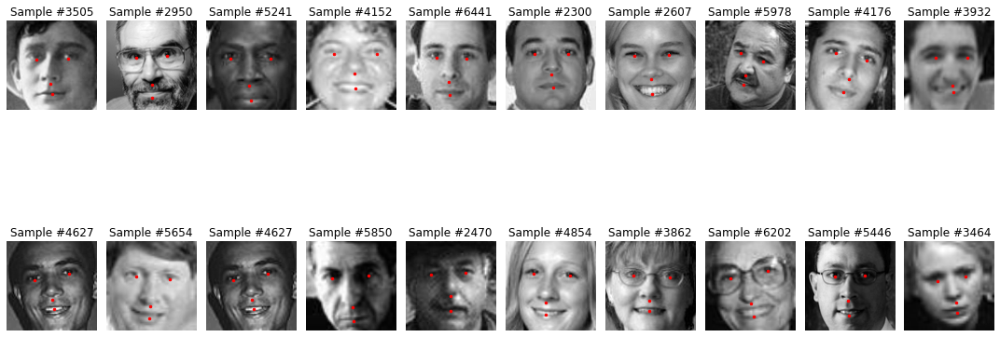


Examples of images missing right_eye_inner_corner_y


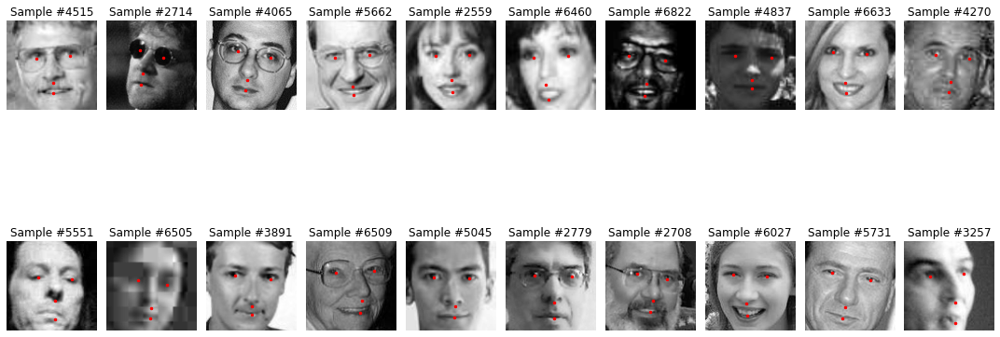


Examples of images missing right_eye_outer_corner_x


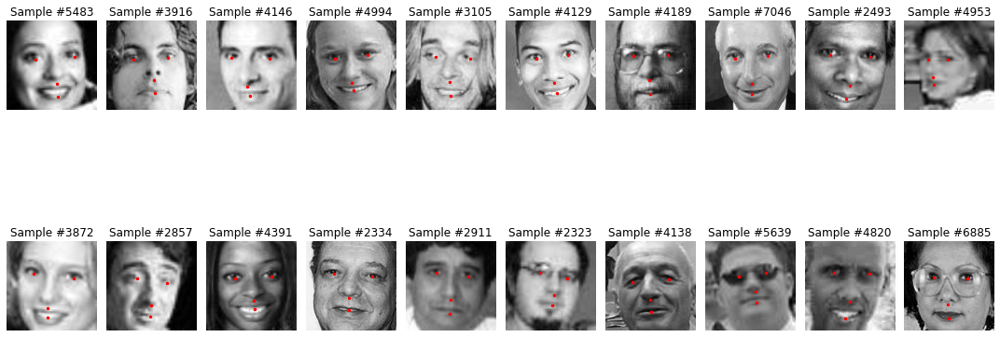


Examples of images missing right_eye_outer_corner_y


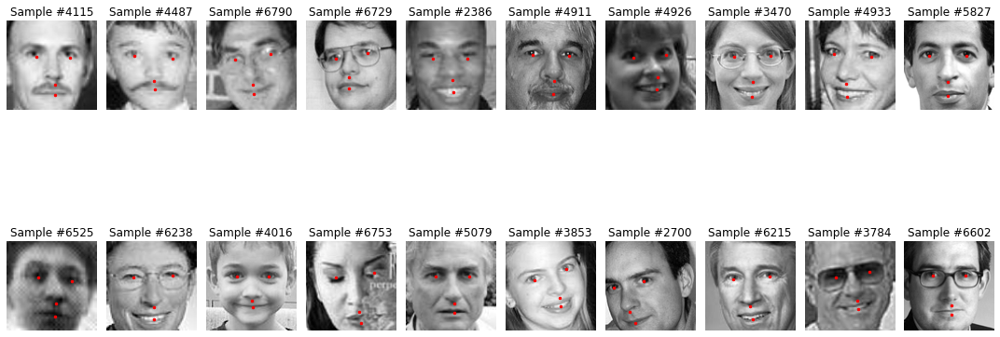


Examples of images missing left_eyebrow_inner_end_x


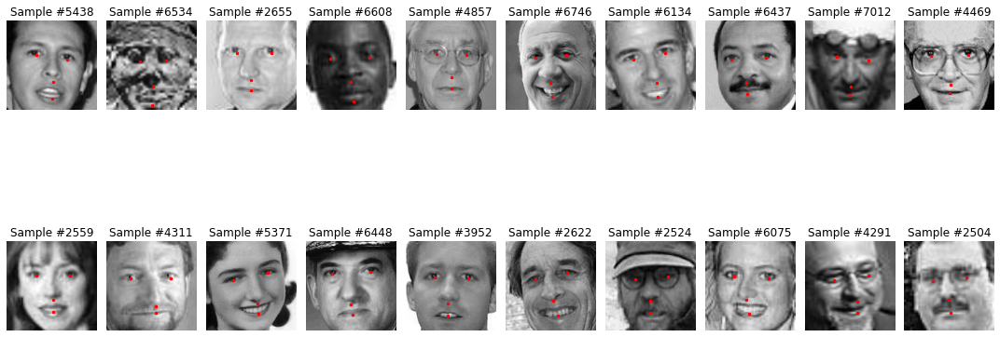


Examples of images missing left_eyebrow_inner_end_y


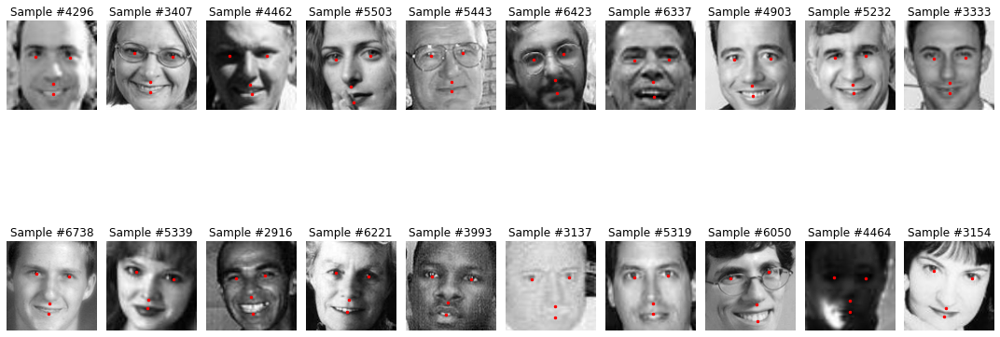


Examples of images missing left_eyebrow_outer_end_x


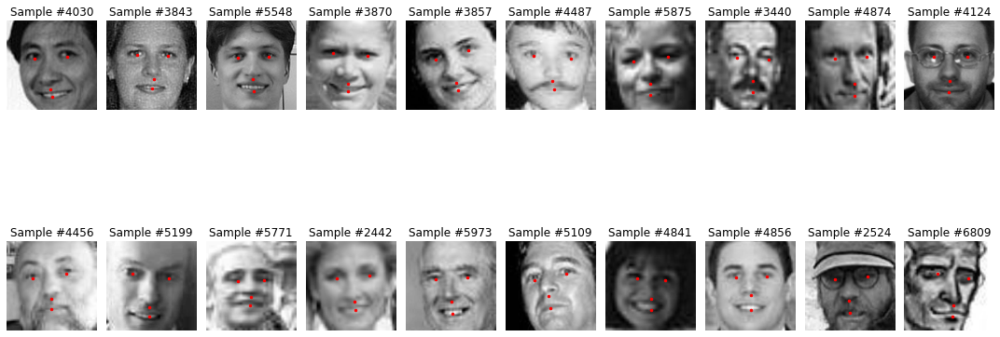


Examples of images missing left_eyebrow_outer_end_y


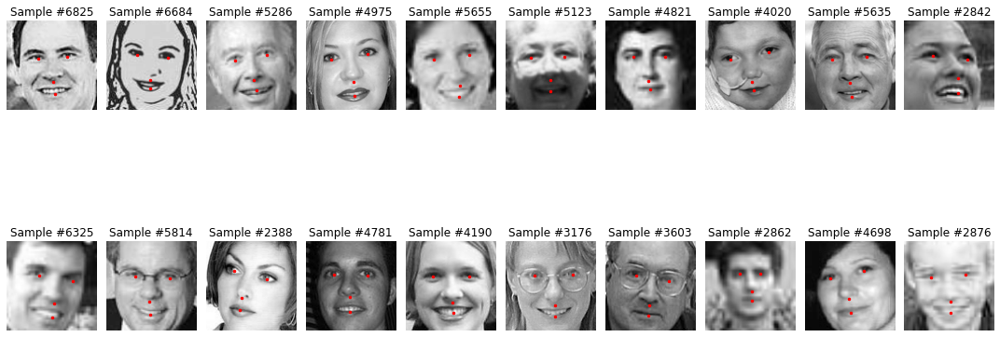


Examples of images missing right_eyebrow_inner_end_x


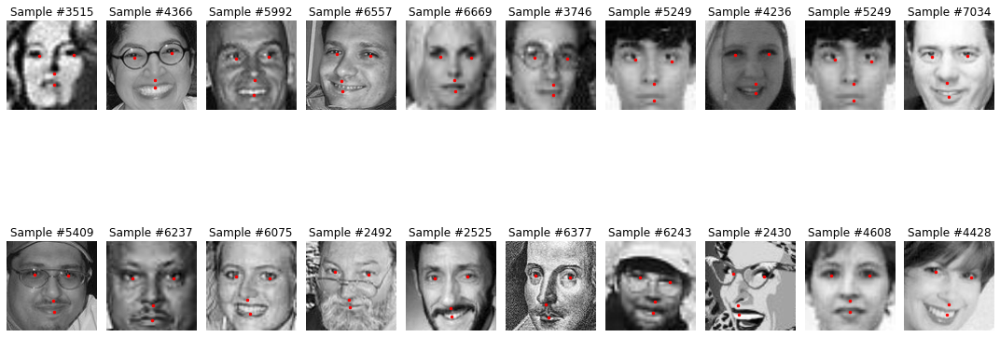


Examples of images missing right_eyebrow_inner_end_y


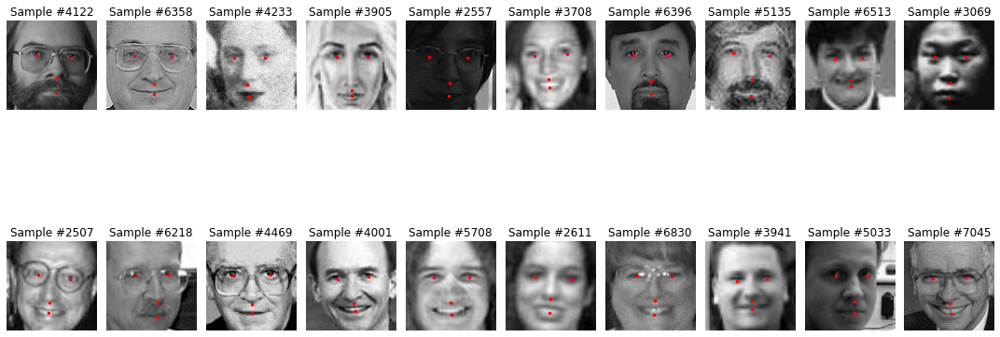


Examples of images missing right_eyebrow_outer_end_x


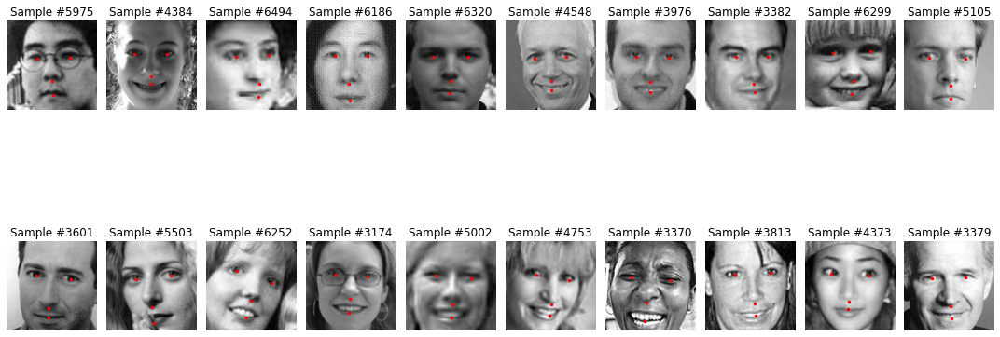


Examples of images missing right_eyebrow_outer_end_y


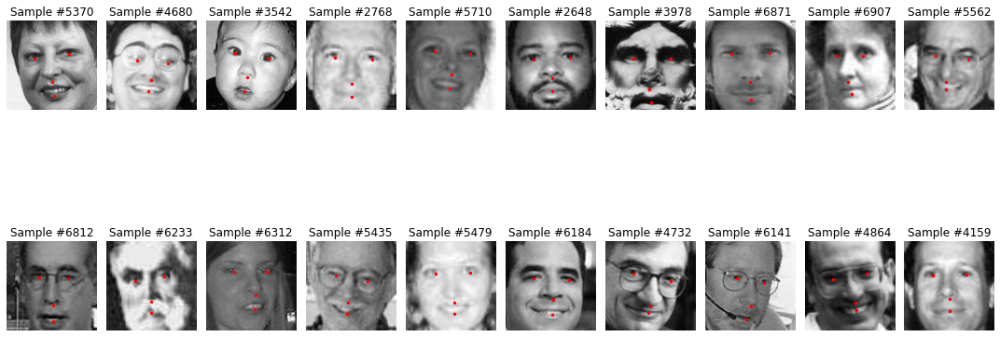


Examples of images missing mouth_left_corner_x


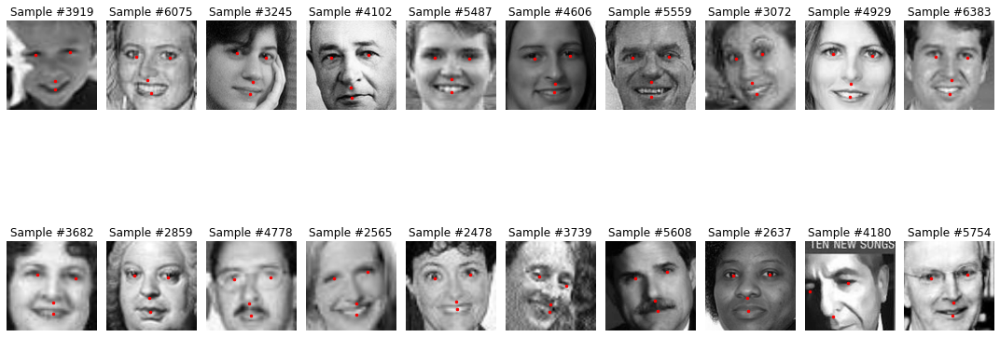


Examples of images missing mouth_left_corner_y


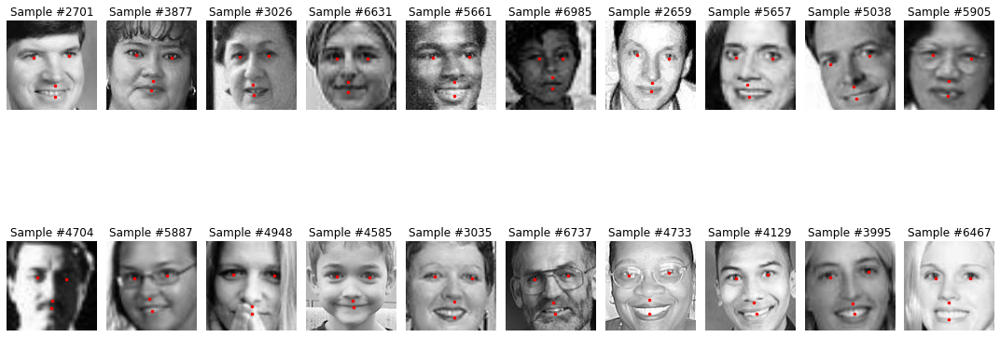


Examples of images missing mouth_right_corner_x


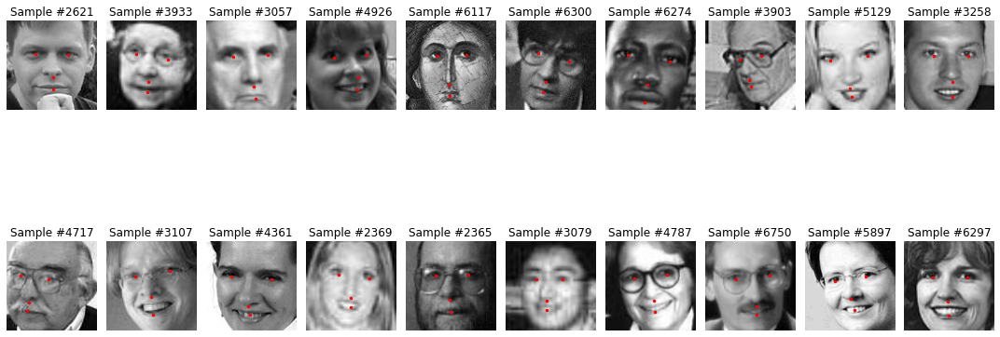


Examples of images missing mouth_right_corner_y


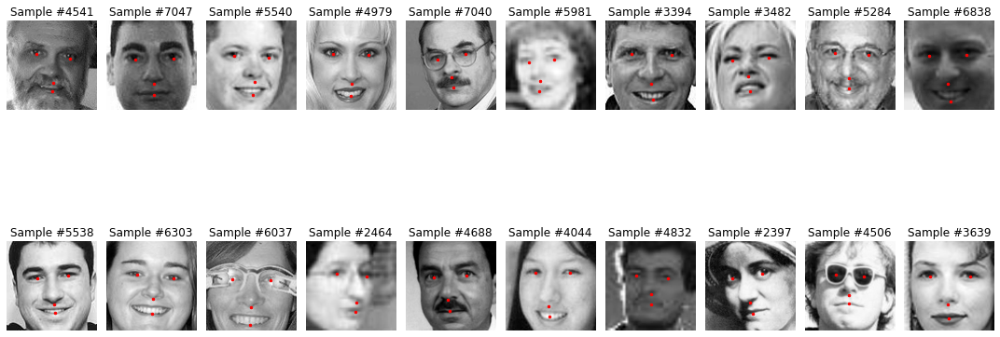


Examples of images missing mouth_center_top_lip_x


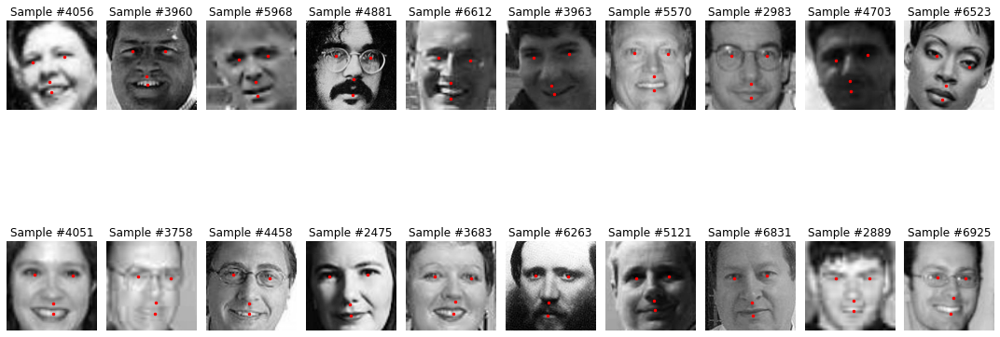


Examples of images missing mouth_center_top_lip_y


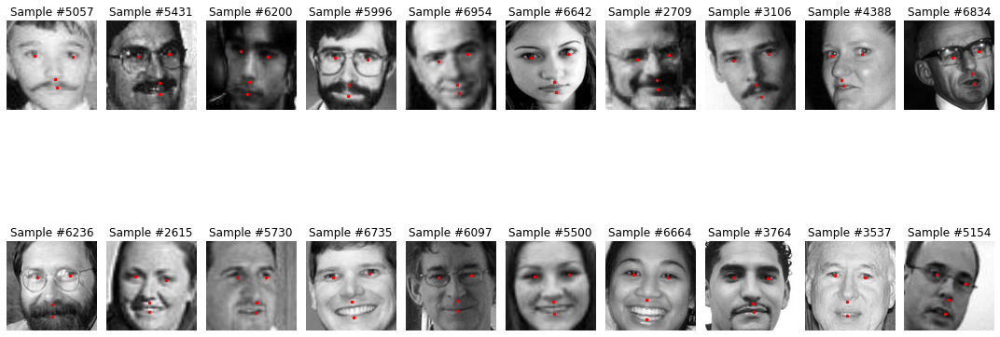


Examples of images missing mouth_center_bottom_lip_x


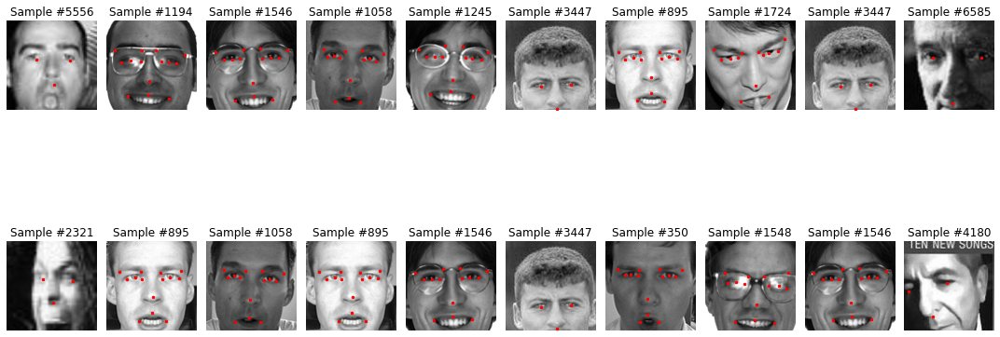


Examples of images missing mouth_center_bottom_lip_y


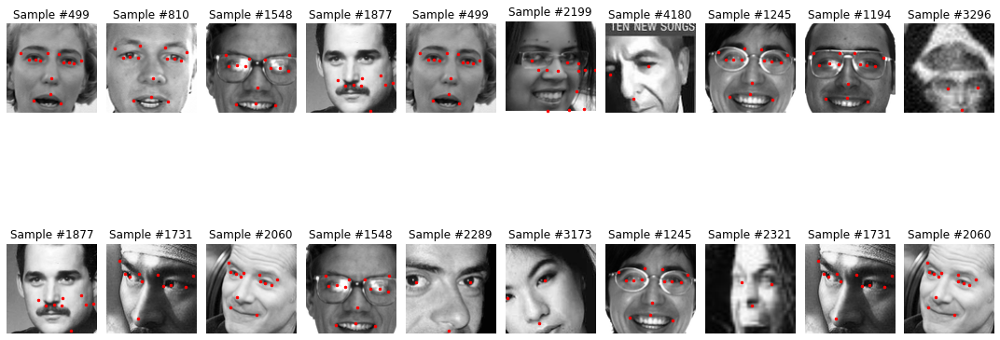

In [26]:
# show examples of up to 20 images with missing data for each column

column_labels = train_data.columns[:-1]

for i in range(len(column_labels)):
    if len(missing_data_indices[i]) == 0:
        continue
    elif len(missing_data_indices[i]) <= 20:
        print("\nExamples of images missing {}".format(column_labels[i]))
        show_images(train_data, missing_data_indices[i], ncols=10)
    else:
        print("\nExamples of images missing {}".format(column_labels[i]))
        rnd_ind = np.random.choice(missing_data_indices[i], 20)
        show_images(train_data, rnd_ind, ncols=10)

# Data Augmentation

We believed the most sensible approach to be to throw out the images with missing data (rather than do a forward fill and keep these images) and use the remaining "clean" data. We then augment the data to "re-create" the problematic missing images - by shifting them, by rotating them, etc. We can then use this dataset to train our model and predict on the new test data. 

In [27]:
# Create 'partial' (missing values) dataset from train_data
train_data_partial = train_data.dropna()
print("Shape of training dataset with no missing values: {}".format(
    train_data_partial.shape))

Shape of training dataset with no missing values: (2140, 31)


In [28]:
%time
# Separate data into features and labels using helper functions

X_full = get_features(train_data, dim=2)
y_full = get_labels(train_data)
X_test = get_features(test_data, dim=2)

print("Full training data with missing values:")
print("Training features shape: {}".format(X_full.shape))
print("Training labels shape: {}".format(y_full.shape))
print("Test features shape: {}".format(X_test.shape))

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs
Full training data with missing values:
Training features shape: (7049, 96, 96, 1)
Training labels shape: (7049, 30)
Test features shape: (1783, 96, 96, 1)


In [29]:
%time
# Drop rows with missing values
X_partial = load_images(train_data_partial)
y_partial = train_data_partial.drop("Image", axis=1).to_numpy()

print("Partial training data with NO missing values:")
print("Training features shape: {}".format(X_partial.shape))
print("Training labels shape: {}".format(y_partial.shape))

X_full_converted = convert_images(X_full)
X_partial_converted = convert_images(X_partial)
X_test_converted = convert_images(X_test)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.58 µs
Partial training data with NO missing values:
Training features shape: (2140, 96, 96, 1)
Training labels shape: (2140, 30)


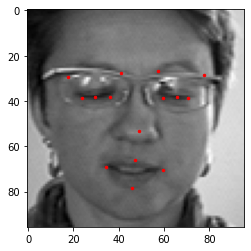

In [30]:
# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.34 µs
(2140, 96, 96, 1)
(2140, 30)


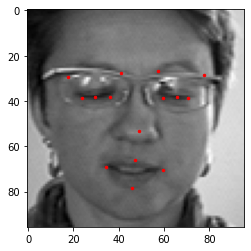

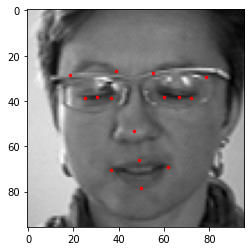

In [31]:
# Horizontal Flip
%time
test_feat, test_lab = flip_horizontal(X_partial_converted, y_partial)
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[210], test_lab[210], axis)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.58 µs
(21400, 96, 96, 1)
(21400, 30)


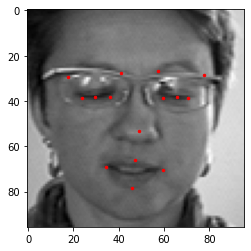

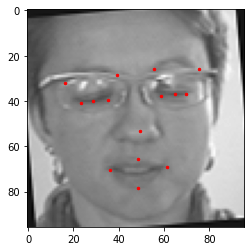

In [32]:
# Rotation
%time
test_feat, test_lab = perform_rotation(X_partial_converted, y_partial)
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[210], test_lab[210], axis)

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 3.34 µs
(40, 96, 96, 1)
(40, 30)


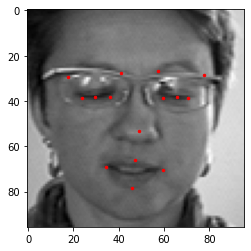

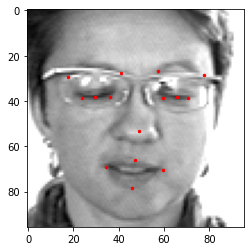

In [33]:
# Lighting
%time
test_feat, test_lab = update_lighting(
    X_partial_converted[210:220], y_partial[210:220])
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[30], test_lab[30], axis)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 3.34 µs
(21, 96, 96, 1)
(21, 30)


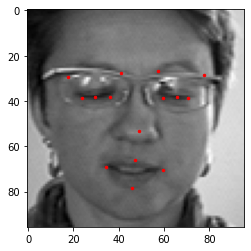

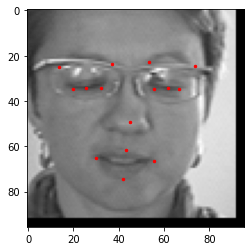

In [34]:
# Re-Center
%time
test_feat, test_lab = move_center(
    X_partial_converted[210:212], y_partial[210:212])
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[6], test_lab[6], axis)

CPU times: user 1 µs, sys: 1e+03 ns, total: 2 µs
Wall time: 3.58 µs
(2, 96, 96, 1)
(2, 30)


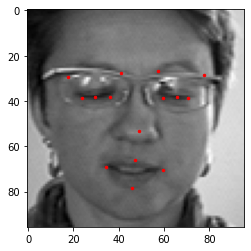

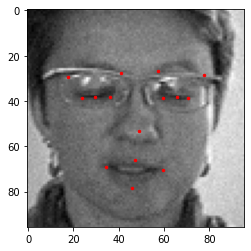

In [35]:
# Add noise
%time
test_feat, test_lab = add_noise(
    X_partial_converted[210:212], y_partial[210:212])
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[0], test_lab[0], axis)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.34 µs
(2, 96, 96, 1)
(2, 30)


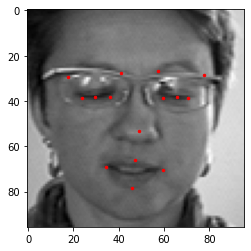

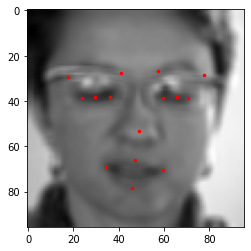

In [36]:
# Add Blur
%time
test_feat, test_lab = add_blur(
    X_partial_converted[210:212], y_partial[210:212])
print(test_feat.shape)
print(test_lab.shape)

# Original Image
fig, axis = plt.subplots()
plot_img(X_partial_converted[210], y_partial[210], axis)
# Show example
fig, axis = plt.subplots()
plot_img(test_feat[0], test_lab[0], axis)

Now we build the full dataset with augmented images, which will be used to train our data. 

In [37]:
# Build up training dataset using augmentation methods

%time
# For partial dataset

# control table used to apply augmentation methods; code currently assumes all are set to True
# ignore
# flip = True
# rotate = True
# light = True
# move = True
# noise = True

# Progress through augmentations
print("\nPartial training data with NO missing values\nBefore augmentation steps:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_converted.shape, y_partial.shape))

# Flip
X_partial_flip, y_partial_flip = flip_horizontal(
    X_partial_converted, y_partial)
X_partial_accum1 = np.concatenate((X_partial_converted, X_partial_flip))
y_partial_accum1 = np.concatenate((y_partial, y_partial_flip))
print("\nAfter flipping horizontally:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_accum1.shape, y_partial_accum1.shape))

# Rotate
X_partial_rotate, y_partial_rotate = perform_rotation(
    X_partial_converted, y_partial)
X_partial_accum2 = np.concatenate((X_partial_accum1, X_partial_rotate))
y_partial_accum2 = np.concatenate((y_partial_accum1, y_partial_rotate))
print("\nAfter performing rotations:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_accum2.shape, y_partial_accum2.shape))

# Light
X_partial_light, y_partial_light = update_lighting(
    X_partial_converted, y_partial)
X_partial_accum3 = np.concatenate((X_partial_accum2, X_partial_light))
y_partial_accum3 = np.concatenate((y_partial_accum2, y_partial_light))
print("\nAfter updating lighting:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_accum3.shape, y_partial_accum3.shape))

# Move
X_partial_move, y_partial_move = move_center(X_partial_converted, y_partial)
X_partial_accum4 = np.concatenate((X_partial_accum3, X_partial_move))
y_partial_accum4 = np.concatenate((y_partial_accum3, y_partial_move))
print("\nAfter moving the image center:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_accum4.shape, y_partial_accum4.shape))

# Add noise
X_partial_noise, y_partial_noise = add_noise(X_partial_converted, y_partial)
X_partial_accum5 = np.concatenate((X_partial_accum4, X_partial_noise))
y_partial_accum5 = np.concatenate((y_partial_accum4, y_partial_noise))
print("\nAfter adding noise:\nFeatures shape: {}     Labels shape: {}".format(
    X_partial_accum5.shape, y_partial_accum5.shape))

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.34 µs

Partial training data with NO missing values
Before augmentation steps:
Features shape: (2140, 96, 96, 1)     Labels shape: (2140, 30)

After flipping horizontally:
Features shape: (4280, 96, 96, 1)     Labels shape: (4280, 30)

After performing rotations:
Features shape: (25680, 96, 96, 1)     Labels shape: (25680, 30)

After updating lighting:
Features shape: (34240, 96, 96, 1)     Labels shape: (34240, 30)

After moving the image center:
Features shape: (53518, 96, 96, 1)     Labels shape: (53518, 30)

After adding noise:
Features shape: (55658, 96, 96, 1)     Labels shape: (55658, 30)


# Model

Note that we split the data after augmentation- if we didn't, then we would only have majority clean images in our dev set, which isn't as represenative of the entire image dataset we recieved at the beginning of this challenge.

In [38]:
X_train, X_dev, y_train, y_dev = train_test_split(X_partial_accum5,
                                                  y_partial_accum5,
                                                  test_size=0.2,
                                                  random_state=42)
print(f"Train examples: {X_train.shape[0]}")
print(f"Train labels: {y_train.shape[0]}")
print(f"Dev examples: {X_dev.shape[0]}")
print(f"Dev labels {y_dev.shape[0]}")

Train examples: 44526
Train labels: 44526
Dev examples: 11132
Dev labels 11132


Our baseline model is a simple convolutional neural network (CNN). Our baseline includes two convolutional layers with rectified linear unit (ReLU) activations, maxpooling layers sandwiched in between, and a fully-connected feedforward network consisting of one hidden layer and final output layer of 30 nodes.

In [39]:
# Baseline Model

# Setting example image dimensions
img_rows = 96
img_cols = 96

# ===Begin Specifying Baseline CNN Architecture===
cnn_model = Sequential()

# 32 Convolution filters used
cnn_model.add(Conv2D(32, kernel_size=(3, 3), activation='relu',
                     padding='same', input_shape=(img_rows, img_cols, 1)))

# Choose best features using max pooling layer
# 2d can be used for 2 dimensional input. No depth here.
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# 64 Convolution filters used, each of size 3x3
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))

# Choose best features using max pooling layer
# 2d can be used for 2 dimensional input. No depth here.
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten convolution features to pass through into the feed forward network. So 2d layer to 1d layer.
cnn_model.add(Flatten())

cnn_model.add(Dense(units=128, input_dim=128, activation='relu'))

# During gradient descent, you're refining 50 nod
cnn_model.add(Dense(units=30, input_dim=50))  # 10 node network

# Summarize Model
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 23, 23, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 33856)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               4333696   
_________________________________________________________________
dense_1 (Dense)              (None, 30)                3

Our more complex model expands the baseline architecture by adding more convolutions for expanded image feature detection and more hidden layers in the feedforward network. In both models, we choose filters in increasing size in powers of 2, which scale efficiently with vectorized operations. We stick with a standard odd kernel size of 3x3 windows for our convolutions and downsample the inputs with a 2x2 window for pooling.

In the more sophisticated model, we intersperse dropout layers which randomly deactivate an increasing proportion of the nodes (+10% step size at each subsequent dropout layer) such that the model will not overfit on the unseen test data. Dropout also drastically reduces the number of total estimatable parameters from the baseline 4.3 million to just over 900k parameters. This helps with substantially reducing the more complex model’s training time.

This overall model architecture was inspired by this “NaimishNet” paper (https://arxiv.org/pdf/1710.00977.pdf) which was fit on individual facial keypoints. We instead use a slightly tweaked version of this architecture to predict all 15 facial keypoint coordinates at once. We also padded the initial convolution layer, although it shouldn’t make that much of an impact, since keypoints shouldn’t really be near the borders of the images.

In [40]:
# Compile and train the CNN
# 12/4: ADDED EARLY STOPPING CONDITION
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)

cnn_model.compile(optimizer="adam", loss='mean_squared_error', metrics=['mae'])

cnn_model.fit(X_train, y_train, epochs=50,
              batch_size=256, validation_split=0.2)

Epoch 1/50
140/140 [==============================] - 12s 83ms/step - loss: 217.1273 - mae: 8.8343 - val_loss: 40.7624 - val_mae: 3.8926
Epoch 2/50
140/140 [==============================] - 11s 79ms/step - loss: 35.0085 - mae: 3.4670 - val_loss: 31.9424 - val_mae: 3.2012
Epoch 3/50
140/140 [==============================] - 11s 79ms/step - loss: 30.9656 - mae: 3.1096 - val_loss: 30.3907 - val_mae: 3.0291
Epoch 4/50
140/140 [==============================] - 11s 79ms/step - loss: 29.4726 - mae: 2.9757 - val_loss: 30.1442 - val_mae: 3.0514
Epoch 5/50
140/140 [==============================] - 11s 79ms/step - loss: 28.4329 - mae: 2.8928 - val_loss: 28.3595 - val_mae: 2.9298
Epoch 6/50
140/140 [==============================] - 11s 79ms/step - loss: 27.7597 - mae: 2.8418 - val_loss: 28.1158 - val_mae: 2.9895
Epoch 7/50
140/140 [==============================] - 11s 80ms/step - loss: 27.1530 - mae: 2.7965 - val_loss: 26.9524 - val_mae: 2.7545
Epoch 8/50
140/140 [===========================

In [41]:
# Improved CNN

# Setting example image dimensions
img_rows = 96
img_cols = 96

# ===Begin Specifying Baseline CNN Architecture===
improved_cnn_model = Sequential()

# Adding the convolutional layers with relu activation, 2x2 maxpooling, and a dropout layers with +0.1 step size
improved_cnn_model.add(Conv2D(32, kernel_size=(
    3, 3), activation='relu', padding='same', input_shape=(img_rows, img_cols, 1)))
# 2d can be used for 2 dimensional input. No depth here.
improved_cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
improved_cnn_model.add(Dropout(0.1))

improved_cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
improved_cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
improved_cnn_model.add(Dropout(0.2))

improved_cnn_model.add(Conv2D(128, (3, 3), activation='relu'))
improved_cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
improved_cnn_model.add(Dropout(0.3))

improved_cnn_model.add(Conv2D(256, (3, 3), activation='relu'))
improved_cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
improved_cnn_model.add(Dropout(0.4))

# Flatten convolution features to pass through into the feed forward network.
improved_cnn_model.add(Flatten())

improved_cnn_model.add(Dense(units=128, input_dim=128, activation='relu'))
improved_cnn_model.add(Dropout(0.5))

improved_cnn_model.add(Dense(units=128, input_dim=128, activation='relu'))
improved_cnn_model.add(Dropout(0.6))
# During gradient descent, you're refining 50 nod
improved_cnn_model.add(Dense(units=30, input_dim=50))  # 10 node network

# Summarize Model
improved_cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 96, 96, 32)        320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 46, 46, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 23, 23, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 21, 21, 128)      

In [42]:
# Improved CNN Model
improved_cnn_model.compile(
    optimizer="adam", loss='mean_squared_error', metrics=['mae'])

# Vector operations are optimized for sizes which are in powers of 2
improved_cnn_model.fit(X_train, y_train, epochs=300,
                       batch_size=256, validation_split=0.2)

Epoch 1/300
140/140 [==============================] - 16s 113ms/step - loss: 613.3459 - mae: 18.6991 - val_loss: 410.7504 - val_mae: 17.8455
Epoch 2/300
140/140 [==============================] - 16s 111ms/step - loss: 206.2321 - mae: 10.9404 - val_loss: 261.8928 - val_mae: 13.9692
Epoch 3/300
140/140 [==============================] - 16s 111ms/step - loss: 173.1122 - mae: 9.9041 - val_loss: 150.2687 - val_mae: 10.0985
Epoch 4/300
140/140 [==============================] - 16s 111ms/step - loss: 158.0439 - mae: 9.3929 - val_loss: 164.7000 - val_mae: 10.6537
Epoch 5/300
140/140 [==============================] - 15s 111ms/step - loss: 151.4525 - mae: 9.1804 - val_loss: 138.5190 - val_mae: 9.6384
Epoch 6/300
140/140 [==============================] - 16s 111ms/step - loss: 144.0366 - mae: 8.9236 - val_loss: 78.6836 - val_mae: 6.5929
Epoch 7/300
140/140 [==============================] - 16s 111ms/step - loss: 138.9284 - mae: 8.7405 - val_loss: 74.9657 - val_mae: 6.3496
Epoch 8/300
140/

Epoch 60/300
140/140 [==============================] - 15s 110ms/step - loss: 55.9128 - mae: 5.4585 - val_loss: 21.7320 - val_mae: 2.8660
Epoch 61/300
140/140 [==============================] - 15s 110ms/step - loss: 54.9422 - mae: 5.4209 - val_loss: 19.0536 - val_mae: 2.7268
Epoch 62/300
140/140 [==============================] - 15s 110ms/step - loss: 54.8338 - mae: 5.4128 - val_loss: 18.7120 - val_mae: 2.7578
Epoch 63/300
140/140 [==============================] - 15s 110ms/step - loss: 54.3365 - mae: 5.3862 - val_loss: 16.9053 - val_mae: 2.5935
Epoch 64/300
140/140 [==============================] - 15s 110ms/step - loss: 54.1587 - mae: 5.3833 - val_loss: 18.2945 - val_mae: 2.6824
Epoch 65/300
140/140 [==============================] - 15s 110ms/step - loss: 53.5219 - mae: 5.3527 - val_loss: 18.0009 - val_mae: 2.7185
Epoch 66/300
140/140 [==============================] - 15s 110ms/step - loss: 53.7540 - mae: 5.3758 - val_loss: 18.4432 - val_mae: 2.6339
Epoch 67/300
140/140 [=====

Epoch 119/300
140/140 [==============================] - 15s 109ms/step - loss: 43.5754 - mae: 4.8646 - val_loss: 17.3412 - val_mae: 2.6168
Epoch 120/300
140/140 [==============================] - 15s 110ms/step - loss: 43.4104 - mae: 4.8461 - val_loss: 14.8168 - val_mae: 2.3893
Epoch 121/300
140/140 [==============================] - 15s 110ms/step - loss: 43.3423 - mae: 4.8440 - val_loss: 15.4601 - val_mae: 2.4872
Epoch 122/300
140/140 [==============================] - 15s 110ms/step - loss: 43.2887 - mae: 4.8415 - val_loss: 15.3378 - val_mae: 2.4546
Epoch 123/300
140/140 [==============================] - 15s 110ms/step - loss: 43.3354 - mae: 4.8488 - val_loss: 15.1896 - val_mae: 2.5000
Epoch 124/300
140/140 [==============================] - 15s 110ms/step - loss: 43.2646 - mae: 4.8361 - val_loss: 15.9106 - val_mae: 2.4680
Epoch 125/300
140/140 [==============================] - 15s 110ms/step - loss: 42.9560 - mae: 4.8227 - val_loss: 17.7057 - val_mae: 2.5895
Epoch 126/300
140/14

140/140 [==============================] - 15s 110ms/step - loss: 36.1936 - mae: 4.4196 - val_loss: 15.0731 - val_mae: 2.3848
Epoch 178/300
140/140 [==============================] - 15s 110ms/step - loss: 36.3915 - mae: 4.4355 - val_loss: 15.2822 - val_mae: 2.4567
Epoch 179/300
140/140 [==============================] - 15s 110ms/step - loss: 36.7320 - mae: 4.4333 - val_loss: 15.0196 - val_mae: 2.4201
Epoch 180/300
140/140 [==============================] - 15s 110ms/step - loss: 36.5867 - mae: 4.4275 - val_loss: 15.0928 - val_mae: 2.4930
Epoch 181/300
140/140 [==============================] - 15s 110ms/step - loss: 36.0959 - mae: 4.4108 - val_loss: 14.0947 - val_mae: 2.3353
Epoch 182/300
140/140 [==============================] - 15s 110ms/step - loss: 36.0014 - mae: 4.4052 - val_loss: 14.3278 - val_mae: 2.3707
Epoch 183/300
140/140 [==============================] - 15s 110ms/step - loss: 35.8613 - mae: 4.3846 - val_loss: 15.0469 - val_mae: 2.4253
Epoch 184/300
140/140 [===========

140/140 [==============================] - 15s 110ms/step - loss: 30.9164 - mae: 4.0551 - val_loss: 13.9725 - val_mae: 2.2741
Epoch 236/300
140/140 [==============================] - 15s 110ms/step - loss: 30.8398 - mae: 4.0591 - val_loss: 13.6580 - val_mae: 2.2642
Epoch 237/300
140/140 [==============================] - 15s 110ms/step - loss: 30.3519 - mae: 4.0351 - val_loss: 13.7508 - val_mae: 2.3013
Epoch 238/300
140/140 [==============================] - 15s 110ms/step - loss: 30.2790 - mae: 4.0272 - val_loss: 13.7379 - val_mae: 2.2594
Epoch 239/300
140/140 [==============================] - 15s 109ms/step - loss: 30.2388 - mae: 4.0228 - val_loss: 14.2108 - val_mae: 2.3013
Epoch 240/300
140/140 [==============================] - 16s 112ms/step - loss: 30.2681 - mae: 4.0149 - val_loss: 14.6908 - val_mae: 2.3403
Epoch 241/300
140/140 [==============================] - 15s 108ms/step - loss: 30.6834 - mae: 4.0411 - val_loss: 15.3234 - val_mae: 2.3601
Epoch 242/300
140/140 [===========

140/140 [==============================] - 15s 111ms/step - loss: 25.7548 - mae: 3.7008 - val_loss: 12.8175 - val_mae: 2.1487
Epoch 294/300
140/140 [==============================] - 15s 110ms/step - loss: 25.9190 - mae: 3.7081 - val_loss: 13.0434 - val_mae: 2.1931
Epoch 295/300
140/140 [==============================] - 15s 110ms/step - loss: 25.6628 - mae: 3.7018 - val_loss: 13.9191 - val_mae: 2.2282
Epoch 296/300
140/140 [==============================] - 15s 110ms/step - loss: 25.6533 - mae: 3.6911 - val_loss: 13.0124 - val_mae: 2.1829
Epoch 297/300
140/140 [==============================] - 15s 110ms/step - loss: 25.5044 - mae: 3.6747 - val_loss: 12.1551 - val_mae: 2.1415
Epoch 298/300
140/140 [==============================] - 15s 110ms/step - loss: 25.3627 - mae: 3.6718 - val_loss: 13.4149 - val_mae: 2.2529
Epoch 299/300
140/140 [==============================] - 15s 110ms/step - loss: 25.6575 - mae: 3.6780 - val_loss: 12.2728 - val_mae: 2.1272
Epoch 300/300
140/140 [===========

In [43]:
# Save model
# Serialize model to JSON
cnn_model_json = cnn_model.to_json()
with open("models/baseline_cnn_data.json", "w") as json_file:
    json_file.write(cnn_model_json)

improved_model_json = improved_cnn_model.to_json()
with open("models/improved_cnn_data.json", "w") as json_file:
    json_file.write(improved_model_json)

# Serialize weights to HDF5
cnn_model.save_weights("models/baseline_cnn_data.h5")
print("Saved model to disk")

improved_cnn_model.save_weights("models/improved_cnn_data.h5")
print("Saved model to disk")

Saved model to disk
Saved model to disk


# Error Analysis

Here we examine for both the baseline and the more complex CNN model we tuned which image has the highest prediction error (RMSE). We used two different "dev" sets - one being only the 2k images with all keypoints, and one being the much larger augmented data set. 

In [44]:
# Load json and create model
json_file = open('models/improved_cnn_data.json', 'r')
improved_cnn_model_json = json_file.read()
json_file.close()
improved_cnn_model = model_from_json(improved_cnn_model_json)

json_file = open('models/baseline_cnn_data.json', 'r')
baseline_cnn_data_json = json_file.read()
json_file.close()
cnn_model = model_from_json(baseline_cnn_data_json)

# Load weights into new model
cnn_model.load_weights("models/baseline_cnn_data.h5")
print("Loaded model from disk")

improved_cnn_model.load_weights("models/improved_cnn_data.h5")
print("Loaded model from disk")

Loaded model from disk
Loaded model from disk


The comparison on the dev set begins here. We load in the previously saved models in h5 and json files.


Train examples: 1712
Train labels: 1712
Dev examples: 428
Dev labels 428
Baseline CNN Dev RMSE: 2.79
Improved CNN Dev RMSE: 2.04
Baseline Model


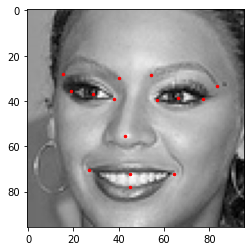

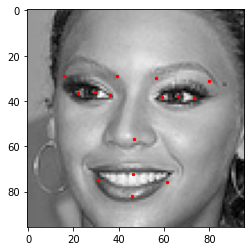

Complex Model


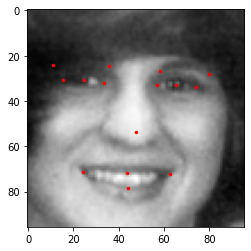

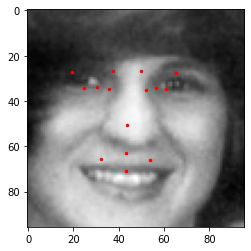

In [45]:
# Dev set: no missing keypoint images
X_train, X_dev, y_train, y_dev = train_test_split(X_partial_converted,
                                                  y_partial,
                                                  test_size=0.2,
                                                  random_state=42)
print(f"Train examples: {X_train.shape[0]}")
print(f"Train labels: {y_train.shape[0]}")
print(f"Dev examples: {X_dev.shape[0]}")
print(f"Dev labels {y_dev.shape[0]}")

# Baseline CNN RMSE
cnn_y_dev_pred = cnn_model.predict(X_dev)
print('Baseline CNN Dev RMSE: %.2f'
      % mean_squared_error(y_dev, cnn_y_dev_pred, squared=False))

# Improved CNN RMSE
improved_cnn_y_dev_pred = improved_cnn_model.predict(X_dev)
print('Improved CNN Dev RMSE: %.2f'
      % mean_squared_error(y_dev, improved_cnn_y_dev_pred, squared=False))

# Biggest RMSE with Baseline
dist = []
for i in range(len(y_dev)):
    dist.append(np.linalg.norm(cnn_y_dev_pred[i]-y_dev[i]))
m = max(dist)
img = [i for i, j in enumerate(dist) if j == m]

X_dev_converted = convert_images(X_dev)
print('Baseline Model')

# Original Image
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], y_dev[img[0]], axis)
# Predicted
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], improved_cnn_y_dev_pred[img[0]], axis)
plt.show()

# Biggest RMSE with Complex Model
dist = []
for i in range(len(y_dev)):
    dist.append(np.linalg.norm(improved_cnn_y_dev_pred[i]-y_dev[i]))
m = max(dist)
img = [i for i, j in enumerate(dist) if j == m]

print('Complex Model')
X_dev_converted = convert_images(X_dev)
img_no = 0
# Original Image
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], y_dev[img[0]], axis)
# Predicted
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], improved_cnn_y_dev_pred[img[0]], axis)

Train examples: 44526
Train labels: 44526
Dev examples: 11132
Dev labels 11132
Baseline CNN Dev RMSE: 3.00
Improved CNN Dev RMSE: 3.48
Baseline Model


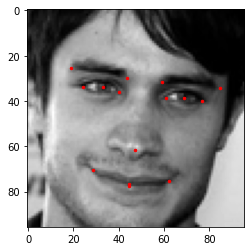

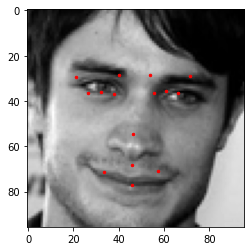

Complex Model


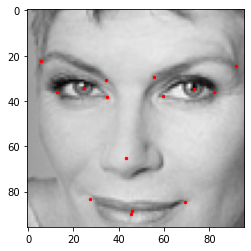

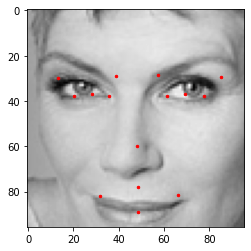

In [46]:
# New Dev set: augmented images
X_train, X_dev, y_train, y_dev = train_test_split(X_partial_accum5,
                                                  y_partial_accum5,
                                                  test_size=0.2,
                                                  random_state=42)
print(f"Train examples: {X_train.shape[0]}")
print(f"Train labels: {y_train.shape[0]}")
print(f"Dev examples: {X_dev.shape[0]}")
print(f"Dev labels {y_dev.shape[0]}")

# Baseline CNN RMSE
cnn_y_dev_pred = cnn_model.predict(X_dev)
print('Baseline CNN Dev RMSE: %.2f'
      % mean_squared_error(y_dev, cnn_y_dev_pred, squared=False))

# Improved CNN RMSE
improved_cnn_y_dev_pred = improved_cnn_model.predict(X_dev)
print('Improved CNN Dev RMSE: %.2f'
      % mean_squared_error(y_dev, improved_cnn_y_dev_pred, squared=False))

# Biggest RMSE with Baseline
dist = []
for i in range(len(y_dev)):
    dist.append(np.linalg.norm(cnn_y_dev_pred[i]-y_dev[i]))
m = max(dist)
img = [i for i, j in enumerate(dist) if j == m]

X_dev_converted = convert_images(X_dev)
print('Baseline Model')
# Original Image
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], y_dev[img[0]], axis)
# Predicted
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], improved_cnn_y_dev_pred[img[0]], axis)
plt.show()

# Biggest RMSE with Complex Model
dist = []
for i in range(len(y_dev)):
    dist.append(np.linalg.norm(improved_cnn_y_dev_pred[i]-y_dev[i]))
m = max(dist)
img = [i for i, j in enumerate(dist) if j == m]

print('Complex Model')
X_dev_converted = convert_images(X_dev)
img_no = 0
# Original Image
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], y_dev[img[0]], axis)
# Predicted
fig, axis = plt.subplots()
plot_img(X_dev_converted[img[0]], improved_cnn_y_dev_pred[img[0]], axis)

Our model seems to make the most errors on scaled images. Note how the keypoints are clustered closer together in the center, as with a zoomed out image. One area of improvement is to add a scaling augmentation. 

Other areas of improvement include sampling from our augmented image data set rather than including all of the images. 